In [16]:
import pickle
import pandas as pd

def load_publications(file_path):
    try:
        publications = []
        with open(file_path, 'rb') as file:
            while True:
                try:
                    batch = pickle.load(file)
                    publications.extend(batch)
                except EOFError:
                    break
        return publications
    except IOError as e:
        print(f"Error: {str(e)}")
        return None

def create_dataframe(publications):
    try:
        df = pd.DataFrame(publications)
        return df
    except ValueError as e:
        print(f"Error: {str(e)}")
        return None

# Replace with the path to your pickle file
file_path = "/Users/nikola/Downloads/publications.pkl"

publications = load_publications(file_path)

if publications is not None:
    df = create_dataframe(publications)

    if df is not None:
        print("DataFrame created successfully:")
        display(df.head())  # Display the first few rows of the DataFrame
        print(df.info())  # Print the summary information of the DataFrame
else:
    print("Failed to load publications from the pickle file.")

DataFrame created successfully:


,crosbiId,bibIrbId,autori,naslov,vrsta,tip,godina,nadredenaPublikacija,casopis,volumen,...,sazeci,kljucneRijeci,poveznice,osobeResources,ustanoveResources,_links,projektiResources,mjesto,izdavac,urednici
0,304137,1172097.0,"Splieth, Christian H. ; Banerjee, Avijit ; Bot...",How to Intervene in the Caries Process in Chil...,prilog u časopisu,izvorni znanstveni rad,2020,Caries research,Caries research,54,...,"[{'cfLangCode': 'en', 'naziv': 'This paper pro...","[{'cfLangCode': 'en', 'naziv': 'children ; car...","[{'urlId': 140032, 'urlVrstaId': 990, 'urlVrst...","{'_embedded': {'osobe': [{'crorisId': 5294, 't...","{'_embedded': {'ustanove': [{'crorisId': 46, '...",{'osobe': {'href': 'https://croris.hr/crosbi-a...,NaN,NaN,NaN,NaN
1,304139,1172099.0,"Šutej, Ivana ; Božić, Darko ; Peroš, Kristina ...",Cigarette smoking and its consequences on peri...,prilog u časopisu,izvorni znanstveni rad,2021,Central European journal of public health,Central European journal of public health,29,...,"[{'cfLangCode': 'en', 'naziv': 'Abstract Objec...","[{'cfLangCode': 'en', 'naziv': 'adolescents ; ...","[{'urlId': 140034, 'urlVrstaId': 990, 'urlVrst...","{'_embedded': {'osobe': [{'crorisId': 19386, '...","{'_embedded': {'ustanove': [{'crorisId': 46, '...",{'osobe': {'href': 'https://croris.hr/crosbi-a...,NaN,NaN,NaN,NaN
2,304142,1172109.0,"Jurišić, Sanja ; Verzak, Željko ; Jurišić, Gor...",Assessment of efficacy of two chlorhexidine mo...,prilog u časopisu,izvorni znanstveni rad,2018,International journal of dental hygiene,International journal of dental hygiene,16,...,"[{'cfLangCode': 'en', 'naziv': 'Objective: To ...","[{'cfLangCode': 'en', 'naziv': 'chlorhexidine ...","[{'urlId': 140037, 'urlVrstaId': 990, 'urlVrst...","{'_embedded': {'osobe': [{'crorisId': 5421, 't...","{'_embedded': {'ustanove': [{'crorisId': 46, '...",{'osobe': {'href': 'https://croris.hr/crosbi-a...,NaN,NaN,NaN,NaN
3,304140,1172100.0,"Paris, Sebastian ; Banerjee, Avijit ; Bottenbe...",How to Intervene in the Caries Process in Olde...,prilog u časopisu,izvorni znanstveni rad,2020,Caries research,Caries research,54,...,"[{'cfLangCode': 'en', 'naziv': 'Aim: To provid...","[{'cfLangCode': 'en', 'naziv': 'older adults ;...","[{'urlId': 140035, 'urlVrstaId': 990, 'urlVrst...","{'_embedded': {'osobe': [{'crorisId': 5294, 't...","{'_embedded': {'ustanove': [{'crorisId': 46, '...",{'osobe': {'href': 'https://croris.hr/crosbi-a...,NaN,NaN,NaN,NaN
4,304141,1172105.0,"Schwendicke, Falk ; Splieth, Christian H ; Bot...",How to intervene in the caries process in adul...,prilog u časopisu,ostalo,2020,Clinical oral investigations,Clinical oral investigations,24,...,"[{'cfLangCode': 'en', 'naziv': 'Objectives To ...","[{'cfLangCode': 'en', 'naziv': 'caries ; conse...","[{'urlId': 140036, 'urlVrstaId': 990, 'urlVrst...","{'_embedded': {'osobe': [{'crorisId': 5294, 't...","{'_embedded': {'ustanove': [{'crorisId': 46, '...",{'osobe': {'href': 'https://croris.hr/crosbi-a...,NaN,NaN,NaN,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 832881 entries, 0 to 832880
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   crosbiId              832881 non-null  int64  
 1   bibIrbId              793946 non-null  float64
 2   autori                815868 non-null  object 
 3   naslov                832868 non-null  object 
 4   vrsta                 832881 non-null  object 
 5   tip                   832881 non-null  object 
 6   godina                832881 non-null  object 
 7   nadredenaPublikacija  574573 non-null  object 
 8   casopis               279053 non-null  object 
 9   volumen               259880 non-null  object 
 10  svescic               198868 non-null  object 
 11  stranice              434512 non-null  object 
 12  doi                   97918 non-null   object 
 13  issn                  287285 non-null  object 
 14  indeksiranost         168281 non-null  object 
 15  

In [ ]:
import networkx as nx
from tqdm import tqdm

# Create an empty graph
G = nx.Graph()

# Iterate over each row in the DataFrame with progress bar
for _, row in tqdm(df.iterrows(), total=len(df), desc="Processing rows"):
    if isinstance(row['autori'], str):
        authors = row['autori'].split(';')
        authors = [author.strip() for author in authors]

        # Add nodes for each author
        for author in authors:
            G.add_node(author)

        # Add edges between authors who worked on the same publication
        for i in range(len(authors)):
            for j in range(i+1, len(authors)):
                G.add_edge(authors[i], authors[j])

In [ ]:
# Print graph information
print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())

# Print node degrees with progress bar
print("Node degrees:")
for node, degree in tqdm(G.degree(), total=G.number_of_nodes(), desc="Processing nodes"):
    print(f"{node}: {degree}")

In [33]:
import networkx as nx
from tqdm import tqdm

# Create an empty graph
G = nx.Graph()

# Iterate over each row in the DataFrame with progress bar
for _, row in tqdm(df.iterrows(), total=len(df), desc="Processing rows"):
    if isinstance(row['autori'], str):
        authors = row['autori'].split(';')
        authors = [author.strip() for author in authors]

        # Add nodes for each author
        for author in authors:
            G.add_node(author)

        # Add edges between authors who worked on the same publication
        for i in range(len(authors)):
            for j in range(i+1, len(authors)):
                G.add_edge(authors[i], authors[j])

# Print graph information
print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())

# Print node degrees with progress bar
print("Node degrees:")
for node, degree in tqdm(G.degree(), total=G.number_of_nodes(), desc="Processing nodes"):
    print(f"{node}: {degree}")

# Save the graph in GraphML format
output_file = "author_graph.graphml"
nx.write_graphml(G, output_file)
print(f"Graph saved as {output_file}")

# Visualize the graph (optional)
nx.draw(G, with_labels=True, node_size=500, font_size=12, node_color='lightblue')

Processing rows: 100%|██████████| 832881/832881 [00:35<00:00, 23316.02it/s]


Number of nodes: 449003
Number of edges: 6043514
Node degrees:


Processing nodes:  10%|█         | 47019/449003 [00:00<00:00, 470155.70it/s]

Splieth, Christian H.: 34
Banerjee, Avijit: 43
Bottenberg, Peter: 33
Breschi, Lorenzo: 33
Campus, Guglielmo: 33
Ekstrand, Kim Rud: 23
Giacaman, Rodrigo A.: 31
Haak, Rainer: 33
Hannig, Matthias: 33
Hickel, Reinhard: 36
Jurić, Hrvoje: 255
Lussi, Adrian: 33
Machiulskiene, Vita: 33
Manton, David J.: 23
Jablonski-Momeni, Anahita: 32
Opdam, Niek J.M.: 23
Paris, Sebastian: 33
Santamaría, Ruth M.: 23
Schwendicke, Falk: 62
Tassery, Herve: 49
Ferreira Zandona, Andrea: 23
Zero, Domenick T.: 23
Zimmer, Stefan: 33
Doméjean, Sophie: 38
Šutej, Ivana: 90
Božić, Darko: 164
Peroš, Kristina: 137
Plančak, Darije: 200
Jurišić, Sanja: 85
Verzak, Željko: 198
Jurišić, Gordan: 4
Ekstrand, Kim: 26
Manton, David: 26
Jablonski- Momeni, Anahita: 23
Santamaria, Ruth: 26
Tassery, Hervé: 26
Zandona, Andrea: 26
Zero, Domenick: 26
Opdam, Niek: 26
Splieth, Christian H: 25
Giacaman, Rodrigo A: 23
Heunis, Christoff: 3
Šuligoj, Filip: 35
Fambuena Santos, Carlos: 3
Misra, Sarthak: 7
Heunis, Christoff M.: 3
Sikorski, Jakub: 

Processing nodes:  22%|██▏       | 97972/449003 [00:00<00:00, 493307.64it/s]

Jančec, Marija: 0
Bijelić, Anja: 0
Hasnek, Marijana: 0
Tomšić, Matej: 0
Fuček, Dominik: 0
Miladinović, Tin: 0
Gregur, Luka: 0
Štefan, Martin: 0
Radić, Karla: 1
Mandić, Hrvoje: 8
Skokić, Dorian: 0
Cirkvenčić, Filip: 1
Horvat Iva: 0
Dotlić, Nicol: 0
Duspara, Doria: 0
Ivankov, Patricia: 0
Zechner, Janko: 3
Milošević, Dora: 0
Dedić, Anđa: 0
Degiacinto, Dario: 0
Soldo, Kata: 0
Udovičić, Domagoj: 0
Žalac, Miroslav: 0
Krželj, Filipa: 3
Aglić Čuvić, Duje: 0
Rupanović, Ana: 0
Pavičić, Viktor: 0
Žilavčić, Tea: 0
Kumerle, Valentina: 0
Jadrijev, Lovre: 0
Opsenica, Nives: 0
Ivešić, Antonela: 0
Bonić-Babić, Renata: 0
Novak, Tamara: 4
Penzar, Marta: 0
Mejovšek, Tea: 0
Polančec, Ksenija: 0
Savina Gruičić: 6
Brlić, Jelena: 0
Zovko, Marjana: 0
Ljubek, Mihaela: 5
Vranješ, Dragana: 0
Širjan, Ana-Marija: 0
Betica Radić, Ljiljana: 148
Glamuzina, Eva: 3
Hrženjak, Ivana: 0
Jurinić, Valentina: 2
Jandrić, Berislav: 13
Granić, Nino: 0
Vranić, Igor: 1
Drenški, Lucija: 0
Berta, Bono: 0
Bujević, Natalija: 0
Sikirić

Processing nodes:  33%|███▎      | 147303/449003 [00:00<00:00, 460981.66it/s]


Vdović, Brigita: 5
Bosnar, Silvia: 5
Robić, Marija: 5
Virkes, Tomislav: 21
Korać, P: 3
Lasan-Trčić, R: 23
Dominis, M: 17
Šamija , Mirko: 5
Majnarić , Ljiljana: 10
Alegić-Karin, Anita: 11
Katuša, Željko: 4
Paić, Ivan: 4
Hađina, Josip: 11
Vrdoljak, Javor: 84
Kujunđić, Milan: 4
Bogdanović, Z.: 18
Krištafor Zdenko: 7
Zelić, Ivo: 7
Crkvenac Gornik, K: 20
Štingl, K: 9
Grubić, Z: 9
Tonković Ð: 11
urišević, I: 12
Letica1, L: 9
Burek, M: 18
Lasan, R: 21
Mužinić, D: 23
Begović D: 9
Hajdarović, Ljiljana: 2
Hajdarović Krešimir: 1
Brscic, Drazen: 3
Brajković, Anita.: 1
Tonković &ETH: 7
Letica, L: 14
Begović, D: 24
Friščić, Alen: 11
Tonkovic Durisevic, I: 6
Muzinic, D: 9
Begovic, D: 7
Bogdanović, Gordana: 12
Ljubic, H: 7
Ćorak Maro: 2
Begovic: 6
D: 9
Merkler, Marijan: 66
Juričić, Ljiljana: 95
Konja, J: 29
Rajic, L: 4
Feminić, R: 4
Martinčić, Nataša: 10
Kaćunić, Antonija: 15
Keserović, Amela: 7
Levak, Vladimir: 12
Matija, Ratko: 2
Havelka-Meštrović, Ana: 6
kozarić-Kovačić, Dragica: 3
Buble, Natali: 

Processing nodes:  43%|████▎     | 193635/449003 [00:00<00:00, 357924.06it/s]

Gouanère, M.: 157
Kustov, D.: 225
Lanza, A: La Rotonda, L.: 157
Rebuffi, C.: 157
Weber, F.W.: 185
Živić Marija: 8
Trgovac, Sanja: 3
Aleksić, Jelena: 46
Galeazzi, GianMaria: 15
Popovski, Mihajlo: 40
Lačić-Toševski, Dušica: 9
Wang, Duolao: 14
Borrmann, H.: 14
Burkhardt, U.: 14
Yu. Grin, Y.: 14
Mehmood, Khurram: 3
Abhayaratnea, Charith: 3
Tubaro, Stefano: 3
Shan, Shiguang: 4
Lukac, Rastislav: 4
Wechsler Harry: 4
Stewart Bartlett, Marian: 5
Patzner, Robert: 1
Mejri, Randa: 2
Ben Hassine, Oum Kalthoum: 2
Kožul, M.: 3
Gajić, Živorad: 4
Morić, A.: 3
Đuro, Senčić: 2
Sonja, Jovanovac: 2
Jagorinac, Dragutin: 3
Vladić, Zora: 4
Nishijama, A.: 2
Horie, Y.: 2
Reinholz, Andreas: 4
Filaković, Pavo, Nađ, Sanea: 2
Heymann, Jared J.: 3
Mietzner, Timothy A.: 6
Crumbliss, Alvin L.: 8
Severović, Goran: 3
Potočnjak, Mirko: 7
Džapo, M., Junašević, M., Lapaine, M., Petrovic, S.: 0
Džapo, M.: 0
Mitak, M.: 12
Pinto Sara: 8
Kashtiban, Reza J.: 14
Rolo, Anabela G.: 14
Chahboun, A.: 37
Bangert, Ursel: 28
Levichev, 

Processing nodes:  64%|██████▍   | 286898/449003 [00:00<00:00, 413470.47it/s]

Hrkać, Serafin: 1
Borić, M.: 4
Staničić, J.: 4
Dabelić, N.: 6
Dorn, Ljubica: 7
Žakić-Milas, Danijela: 17
Staničić J, Prpić M, Jukić T, Borić M, Kusić Z: 0
Stifter, Sanja: 63
Švabić, D.: 1
Tikas, Vera: 20
Kristek, Andrej: 1
Jakir-Bajo, Ivana: 43
Sesar, Vanda: 1
Silobrčić Radić, M.: 7
Anonimno: 0
Nill, Alexander: 2
Halbrook, Morris B.: 1
Radoman, Aleksandar: 0
Baršić, Neven.: 2
Kurtović, Emir: 2
Nikolić, Marko.: 5
Spiroski, Mirko: 8
Trajkov, Dejan: 8
Petlichkovski, Aleksandar: 8
Efinska-Mladenovska, Olivija: 8
Hristomanova, Slavica: 8
Djulejic, Eli: 8
Paneva, Meri: 8
Tomašić, Vedran, Nikolić, Marko.: 4
Britvić-Vetma, Bosiljka: 1
Rosavec , Roman: 8
Dominko , Damir: 8
Barčić , Damir: 8
Starešinić , Damir: 8
Španjol , Željko: 8
Biljaković , Katica: 8
Ožura , Marko: 8
Marković , Nera: 8
Bognolo , Dario: 8
Grgić, Sandra: 21
Britvić-Vetma, Bosiljka:: 1
Srpak, Nives: 11
Bansal, Shweta: 4
Schrier, Robert: 4
Matić , Marko: 2
Raz, Itamar: 10
Wilson, Peter: 10
Kowalska, Irina: 10
Gitt, Anselm: 10
J

Processing nodes:  83%|████████▎ | 374533/449003 [00:00<00:00, 422816.30it/s]

Bodnar, Stanislav: 12
Agustsson, Steinn Ymir: 12
Cao, Jingming: 12
Obergfell, Manuel: 12
Gomonay, Olenka: 12
Sinova, Jairo: 12
Kläui, Matthias: 12
Elmers, Hajo: 12
Jourdan, Martin: 12
Claudia, Vencel: 1
Horvatić- Herceg, Gordana: 13
Tečić Vuger Ana: 13
Ródenas-Rochina, Joaquin: 5
Crnić, Dijana: 8
Jurković, Ena: 5
Prlić Nada, Šarić Ana, Matijašević Biljana, Pekić Vlasta, Lovrić Robert: 0
Plazibat Valentina, Prlić Nada, Kovačević Ana: 0
Kovačević Ana, Prlić Nada, Matijašević Biljana: 0
Pindžo, Renata: 2
Kovačević Suzana: 4
Antulov Fantulin, Nino: 2
Croitoru, Adina-Eliza: 8
Djurdjevic, Vladimir: 8
Kumar, Manjeet: 9
Srdarević, Ivana: 1
Cvrkalj, Edo: 1
Smolar, Denis: 1
Pegoretti Baruteau, Kelly: 21
Javorović, Marica: 1
Zanon, Mario: 3
Filic, Mia: 2
Ruotsalainen, Laura: 2
Walther, Nomusa: 7
Kaiser, Christiane: 7
Freuling, Conrad: 7
Mantzouki, Evanthia: 12
Ibelings, Bas W.: 9
Ceranić, Vedran: 0
Bračun, Maja: 0
Popović Petrušić, Helena: 0
Ploh, Matija: 0
Mikecin, Antonia: 0
Šegan, Milan-Mišo: 

Processing nodes: 100%|██████████| 449003/449003 [00:01<00:00, 418921.45it/s]


Rigato, V: 22
Scomparin, L: 22
Valdrè, S: 40
Velkovski, Zoran: 3
Spitzer, Manfred: 4
Trze Biuk, Antonia: 1
Valenčić, Lynne A.: 2
Pirrie, S.: 13
Turner, A.: 13
Faestermann, Th.: 13
Kociolek, Patrick: 4
Kardum, Leonora: 7
Bernardini, Elisa: 7
Gora, Dariusz: 7
Micanović, Saša: 7
Verša-Ostojić, Damjana: 6
Vrdoljak-Mozetič, Danijela.: 6
Domingo A, Javier: 1
Matešić, M: 2
Bačun, D: 1
Plećaš, K: 1
Radošević, Kristina, Gaurina Srček, Višnja: 4
Kaurloto-Martinić, Đurđica: 1
Tusić, Rozmari, Miletić, Larisa: 0
Tusić Rozmari, Miletić Larisa,: 0
Ključević, Ivana: 3
Tusić, Rozmari, Topić, Milana: 0
Jajtić, Maja: 5
Kolovrat Doris: 3
Madžar Petra: 3
Simonić Edita: 3
Palaić Diana: 3
Rončević-Gržeta Ika, Degmečić Dunja: 0
Rončević-Gržeta Ika, Petrić Daniela: 0
Korent, Petra: 1
Mihelčić, Petra: 36
Jailin, Clément: 11
Mendoza- Quispe, Arturo: 5
Rožić, Marinko: 2
Markova- Car, Elitza: 4
Vatavuk, Josip: 2
Petar Gardijan, Ivana Kardum Goles, Katarina Mujan SYNERGY OF NATURE, CULTURE AND HOSPITALITY: 0
Grgas

Graph saved as author_graph.graphml


In [30]:
df.loc[df['crosbiId'] == 8456]

        crosbiId  bibIrbId                                    autori  \
316054      8456  531673.0  Jukić, Tihomir ; Smode Cvitanović, Mojca   

                           naslov            vrsta     tip godina  \
316054  Zagreb - Gradski projekti  autorska knjiga  ostalo   2011   

       nadredenaPublikacija casopis volumen  ...  \
316054                  NaN     NaN     NaN  ...   

                                                   sazeci  \
316054  [{'cfLangCode': 'hr', 'naziv': 'Ova bi knjiga ...   

                                            kljucneRijeci poveznice  \
316054  [{'cfLangCode': 'hr', 'naziv': 'gradski projek...       NaN   

                                           osobeResources  \
316054  {'_embedded': {'osobe': [{'crorisId': 18393, '...   

                                        ustanoveResources  \
316054  {'_embedded': {'ustanove': [{'crorisId': 40, '...   

                                                   _links  \
316054  {'osobe': {'href': 'https://cr

In [23]:
import networkx as nx

G = nx.Graph()

autori = df['autori'].values[0]

# Add author nodes
for author in autori.split(';'):
    G.add_node(author.strip(), type='author')

# Add institution nodes
if 'ustanoveResources' in df.columns and not pd.isna(df['ustanoveResources'].values[0]):
    ustanove = df['ustanoveResources'].values[0]['_embedded']['ustanove']
    for ustanova in ustanove:
        G.add_node(ustanova['naziv'], type='institution')

# Add project nodes (if available)
if 'projektiResources' in df.columns and not pd.isna(df['projektiResources'].values[0]):
    projekti = df['projektiResources'].values[0]['_embedded']['projekti']
    for projekt in projekti:
        G.add_node(projekt['naziv'], type='project')

# Connect authors to their institutions
if 'ustanoveResources' in df.columns and not pd.isna(df['ustanoveResources'].values[0]):
    ustanove = df['ustanoveResources'].values[0]['_embedded']['ustanove']
    for ustanova in ustanove:
        for author in autori.split(';'):
            G.add_edge(author.strip(), ustanova['naziv'], type='affiliation')

# Connect authors to projects (if available)
if 'projektiResources' in df.columns and not pd.isna(df['projektiResources'].values[0]):
    projekti = df['projektiResources'].values[0]['_embedded']['projekti']
    for projekt in projekti:
        for author in autori.split(';'):
            G.add_edge(author.strip(), projekt['naziv'], type='participation')

# Add attributes to nodes and edges
nx.set_node_attributes(G, {node: {'type': data['type']} for node, data in G.nodes(data=True)})
nx.set_edge_attributes(G, {(u, v): {'type': data['type']} for u, v, data in G.edges(data=True)})

In [20]:
import numpy as np

def ecdf(data):
    """
    Compute the empirical cumulative distribution function (ECDF) of a dataset.

    Args:
        data (array-like): Input data.

    Returns:
        x (numpy.ndarray): Sorted unique values in the data.
        y (numpy.ndarray): Cumulative probability for each value in x.
    """
    # Convert data to a numpy array
    data = np.array(data)

    # Sort the data in ascending order
    sorted_data = np.sort(data)

    # Get the unique values and their counts
    unique_values, counts = np.unique(sorted_data, return_counts=True)

    # Calculate the cumulative counts
    cumulative_counts = np.cumsum(counts)

    # Calculate the cumulative probabilities
    cumulative_probabilities = cumulative_counts / len(data)

    return unique_values, cumulative_probabilities

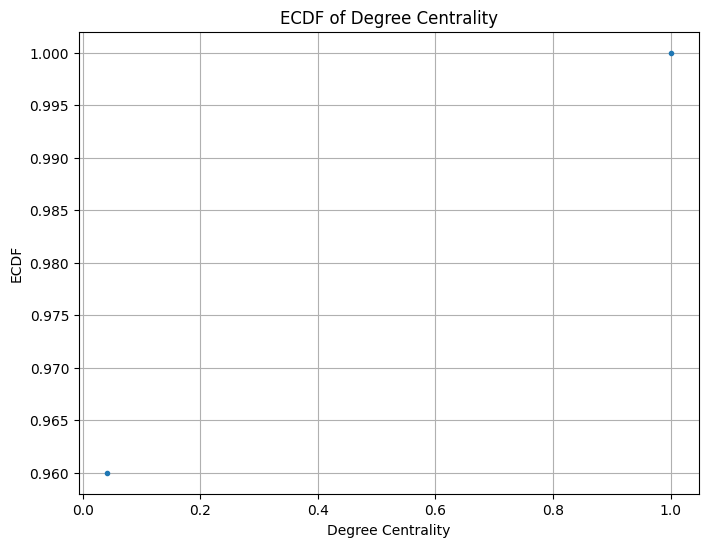

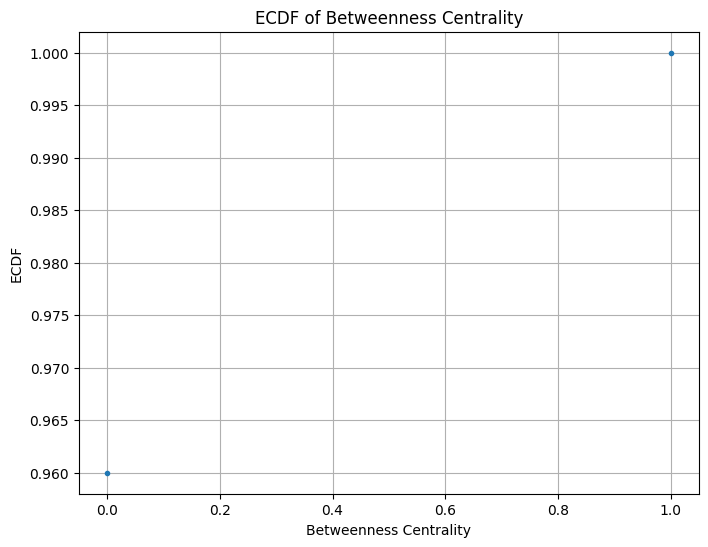

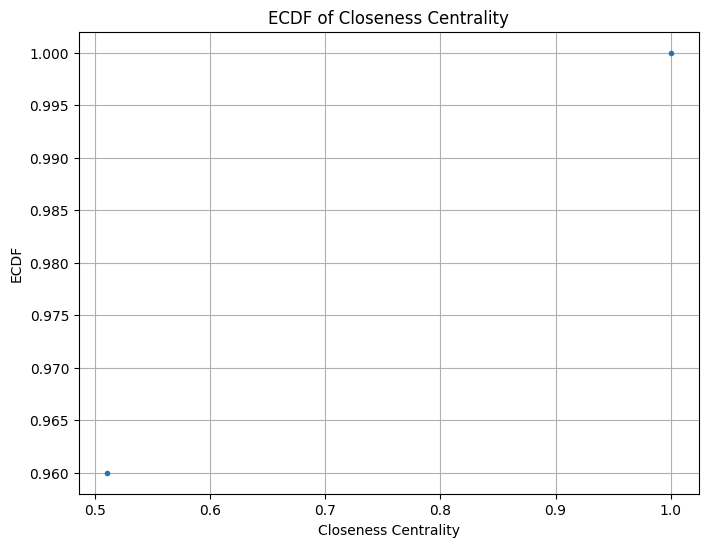

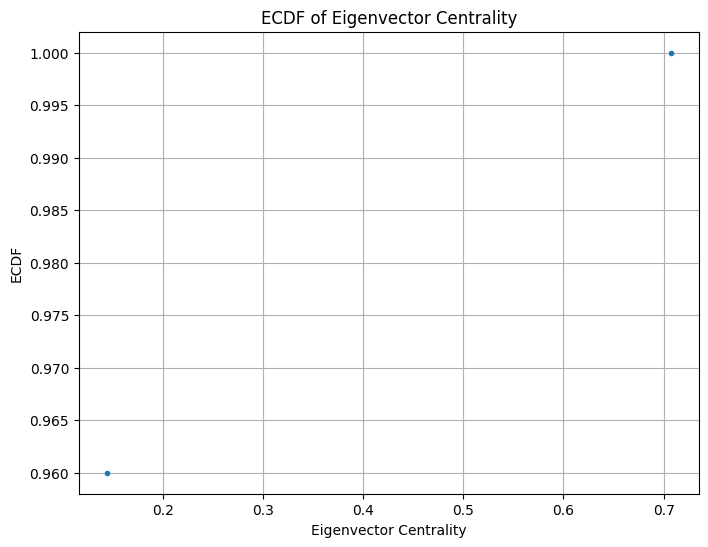

In [21]:
import networkx as nx
import matplotlib.pyplot as plt

# Assuming you have already constructed the graph G

# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)

# Calculate betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G)

# Calculate closeness centrality
closeness_centrality = nx.closeness_centrality(G)

# Calculate eigenvector centrality
eigenvector_centrality = nx.eigenvector_centrality(G)

# Draw ECDF for degree centrality
plt.figure(figsize=(8, 6))
plt.plot(*ecdf(list(degree_centrality.values())), marker='.', linestyle='none')
plt.xlabel('Degree Centrality')
plt.ylabel('ECDF')
plt.title('ECDF of Degree Centrality')
plt.grid(True)
plt.show()

# Draw ECDF for betweenness centrality
plt.figure(figsize=(8, 6))
plt.plot(*ecdf(list(betweenness_centrality.values())), marker='.', linestyle='none')
plt.xlabel('Betweenness Centrality')
plt.ylabel('ECDF')
plt.title('ECDF of Betweenness Centrality')
plt.grid(True)
plt.show()

# Draw ECDF for closeness centrality
plt.figure(figsize=(8, 6))
plt.plot(*ecdf(list(closeness_centrality.values())), marker='.', linestyle='none')
plt.xlabel('Closeness Centrality')
plt.ylabel('ECDF')
plt.title('ECDF of Closeness Centrality')
plt.grid(True)
plt.show()

# Draw ECDF for eigenvector centrality
plt.figure(figsize=(8, 6))
plt.plot(*ecdf(list(eigenvector_centrality.values())), marker='.', linestyle='none')
plt.xlabel('Eigenvector Centrality')
plt.ylabel('ECDF')
plt.title('ECDF of Eigenvector Centrality')
plt.grid(True)
plt.show()

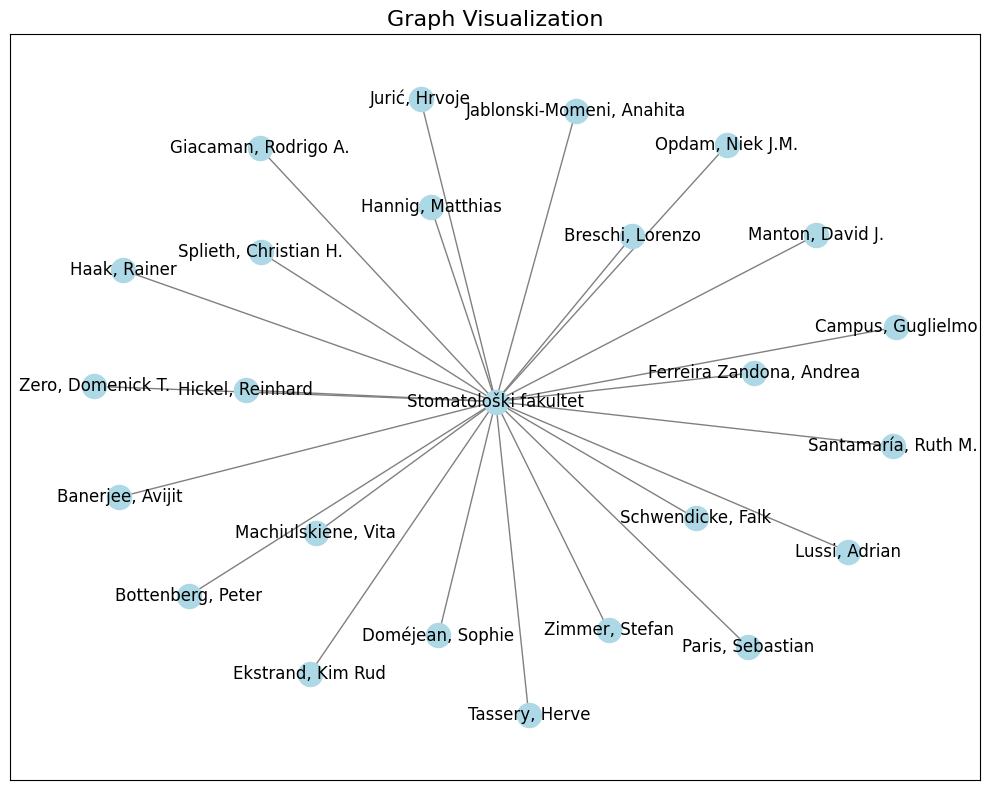

In [22]:
import networkx as nx
import matplotlib.pyplot as plt

# Assuming you have already constructed the graph G

# Create a new figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Draw the graph
pos = nx.spring_layout(G)  # Compute the layout for the nodes
nx.draw_networkx_nodes(G, pos, node_size=300, node_color='lightblue', ax=ax)
nx.draw_networkx_edges(G, pos, edge_color='gray', ax=ax)
nx.draw_networkx_labels(G, pos, font_size=12, ax=ax)

# Set the title and adjust the layout
ax.set_title('Graph Visualization', fontsize=16)
plt.tight_layout()

# Display the plot
plt.show()